In [1]:
!module list

Currently Loaded Modulefiles:
 1) openmpi/4.1.5   2) singularity   3) nci-ai-ml/25.07   4) pbs  
>

In [2]:
from math import ceil
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

import torch
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

import sys,os,time
wdir="/g/data/z00/yxs900/neuraloperators/sfno/curriculum_learning/lowRes/experiments/05_LUCIE_rm_pos_embed/"
sys.path.append(wdir)
from torch_harmonics_local_v2 import *


device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
if torch.cuda.is_available():
    torch.cuda.set_device(0)
    
device

device(type='cuda', index=0)

In [3]:
# prepare the autoregressive dataset
from torch.utils.data import DataLoader
nb_dir="/g/data/z00/yxs900/neuraloperators/sfno/curriculum_learning/lowRes/experiments/10_LUCIE_no_pos_embed_1deg_noDDP"
sys.path.append(nb_dir)
from datasets_res import WBDataset


ddir = "/g/data/wb00/admin/testing/t_WeatherBench_1deg"
dpth_str = f"{ddir}/wb_gg_1deg_2*.nc"
cpth = f"{ddir}/gg_const_1deg.nc"
mpth = f"{ddir}/all_means.npy"
spth = f"{ddir}/all_stds.npy"
rpth = f"{ddir}/all_res.npy"
avs = list(np.load(f"{ddir}/ordering.npy"))
vs_in=['tisr','msdwswrf','mtnlwrf','2t','skt','10u','10v','sp','msl','u50','u200','u850','v50','v200','v850','t50','t200','t500','t850','t1000','q500','q850','q1000','z150','z500','z850']
vs_out=['mtnlwrf','2t','skt','10u','10v','sp','msl','u50','u200','u850','v50','v200','v850','t50','t200','t500','t850','t1000','q500','q850','q1000','z150','z500','z850','log_tp']
iidx = [avs.index(vi) for vi in vs_in]
oidx = [avs.index(vi) for vi in vs_out]
vc = ["lat2d","lon2d","oro"]
nsamples = 87000 # 10 year rollout
#nsamples = 17520*2 # test
idx_start = 3
nworkers = 10

samples = WBDataset(dpth_str,cpth,in_chans=vs_in, out_chans=vs_out, const_chans=vc, norm_paths=[mpth,spth,rpth],iidx=iidx,oidx=oidx,nsamples=nsamples)
v = torch.utils.data.Subset(samples,list(range(idx_start,nsamples,6)))
vdl = DataLoader(v, shuffle=False, batch_size=1, num_workers=nworkers,drop_last=True)

v.indices[:10], len(v.indices), len(vdl)

([3, 9, 15, 21, 27, 33, 39, 45, 51, 57], 14500, 14500)

In [4]:
# prep for plotting.

# read in lat, lon grid
from netCDF4 import Dataset as ncDataset
with ncDataset(cpth, 'r') as ds:
    Lat= ds['lat2d'][:].data
    Lon= ds['lon2d'][:].data

# set figure size
w,h = 5,4
vars = vs_out
nvars=len(vars)

In [5]:
Lat.shape

(181, 360)

In [6]:
# load the best RMSE trained model 
nlat, nlon = Lat.shape

n_in_channels = len(vs_in)+len(vc)
n_out_channels = len(vs_out)

hard_thresholding_fraction = 0.9
model = SphericalFourierNeuralOperatorNet(params = {}, spectral_transform='sht', filter_type = "linear", operator_type='dhconv', img_shape=(nlat, nlon),num_layers=12, in_chans=n_in_channels, out_chans=n_out_channels, scale_factor=1, embed_dim=256, activation_function="silu", big_skip=True, pos_embed=False, use_mlp=True,normalization_layer="layer_norm", hard_thresholding_fraction=hard_thresholding_fraction,mlp_ratio = 2.).to(device)

wdir="/g/data/z00/yxs900/neuraloperators/sfno/curriculum_learning/lowRes/experiments/091_1deg"
jobid="147773854"
ei="104"
ckp = torch.load(f'{wdir}/checkpoints/{jobid}.gadi-pbs/lucie_{ei}.pt')

if list(ckp["model_state_dict"].keys())[0].startswith("module"):
    state_dict = { k[7:]:v for k,v in ckp["model_state_dict"].items()}
    model.load_state_dict(state_dict)
else:
    model.load_state_dict(ckp["model_state_dict"])

In [7]:
def rollout_model_tisr_forcing(vdl, model, device="cuda"):
    asteps=len(vdl)
    c,h,w = vdl.dataset[0][1].shape
    pred_t = torch.zeros(asteps,c)
    targ_t = torch.zeros(asteps,c)
    
    res = torch.tensor(vdl.dataset.dataset.res).to(device)
    model.eval()
    with torch.no_grad():
        for ii, data in enumerate(vdl, 0):
            #print(f"step {ii}, inp shape = {data[0].shape}, tar shape = {data[1].shape}")
            inp, tar = map(lambda x: x.to(device, dtype = torch.float32), data)
            if ii==0:
                prd = inp
            else:
                #the first 5 channels are lat2d, lon2d, orography, tisr, and msdwswrf are used as forcing.
                # the last output channel is diagnostic, leavign log_tp out
                #prd = torch.concatenate((inp[:,:5,:,:], prd[:,:-1,:,:]),axis=1)
                prd = torch.concatenate((inp[:,:6,:,:], prd[:,1:-1,:,:]*res[0,1:-1,:,:]),axis=1)

            prd = model(prd)
            targ_t[ii,:] = torch.mean(tar,dim=(-1,-2))
            pred_t[ii,:] = torch.mean(prd,dim=(-1,-2))
    
    return prd.cpu(),tar.cpu(), pred_t.cpu(), targ_t.cpu()

In [8]:
# run the rollout for the length defined in nsamples
pp,tt,pred_clim_t,true_clim_t = rollout_model_tisr_forcing(vdl, model)

/g/data/z00/yxs900/neuraloperators/sfno/curriculum_learning/lowRes/experiments/05_LUCIE_rm_pos_embed/torch_harmonics_local_v2.py:1242: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(enabled=False):
/g/data/z00/yxs900/neuraloperators/sfno/curriculum_learning/lowRes/experiments/05_LUCIE_rm_pos_embed/torch_harmonics_local_v2.py:1263: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(enabled=False):


# Check the Spatial Pattern

In [9]:
pp.shape

torch.Size([1, 25, 181, 360])

In [10]:
vars = vs_out
nvars=len(vars)

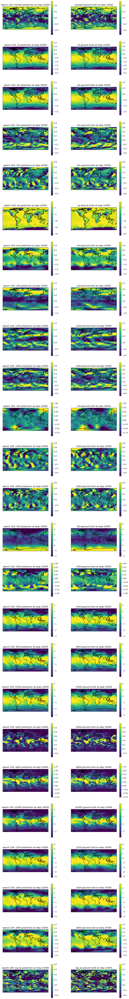

In [11]:
ss = len(vdl)
fig,axs = plt.subplots(nvars,2, figsize=(w*2.5,h*nvars),subplot_kw={'projection': ccrs.PlateCarree()},squeeze=False)
for ii in range(nvars):
    pii = pp[0,ii,:,:]
    tii = tt[0,ii,:,:]
    combined_values = np.concatenate([pii.flatten(), tii.flatten()])
    cmin, cmax = np.nanquantile(combined_values, [0.05, 0.95])
        
    pcm = axs[ii,0].pcolormesh(Lon,Lat,pii,vmin=cmin, vmax=cmax,cmap='viridis', shading='auto')
    axs[ii,0].coastlines()
    axs[ii,0].set_title(f"epoch {ei}: {vars[ii]} prediction at step {ss}")
    fig.colorbar(pcm, ax=axs[ii,0])
    
    pcm1 = axs[ii,1].pcolormesh(Lon,Lat,tii,vmin=cmin, vmax=cmax,cmap='viridis', shading='auto')
    axs[ii,1].coastlines()
    axs[ii,1].set_title(f"{vars[ii]} ground truth at step {ss}")
    fig.colorbar(pcm1, ax=axs[ii,1])

# Compare Global Mean over Time

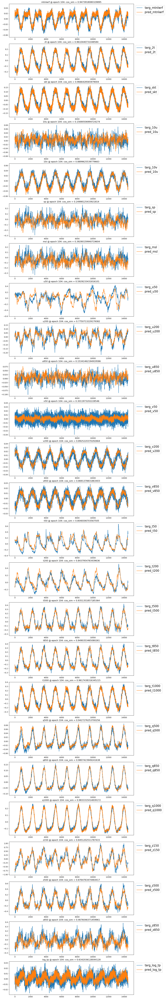

In [12]:
#true_clim_t = torch.mean(tt,dim=(-1,-2))
#pred_clim_t = torch.mean(pp,dim=(-1,-2))

fig,axs = plt.subplots(nvars,1, figsize=(w*2.5,h*nvars))
for ii in range(nvars):
    pcm1 = axs[ii].plot(true_clim_t[:,ii],label=f"targ_{vars[ii]}")
    pcm2 = axs[ii].plot(pred_clim_t[:,ii],label=f"pred_{vars[ii]}")
    ppi = pred_clim_t[1460:,ii].reshape(1, -1)
    tti = true_clim_t[1460:,ii].reshape(1, -1)
    cos_sim = cosine_similarity(ppi, tti)[0, 0]
    axs[ii].set_title(f"{vars[ii]} @ epoch {ei}: cos_sim = {cos_sim}")
    axs[ii].legend(loc='upper left', bbox_to_anchor=(1.003, 1),fontsize=16)

In [13]:
# use cosine similarity to see the scale invariant trend difference?
# it can recongnise both offset and time-shift

from sklearn.metrics.pairwise import cosine_similarity
for ii in range(nvars):
    ppi = pred_clim_t[1460:,ii].reshape(1, -1)
    tti = true_clim_t[1460:,ii].reshape(1, -1)
    cos_sim = cosine_similarity(ppi, tti)[0, 0]
    print(f"Cosine similarity for {vars[ii]}:", cos_sim)

Cosine similarity for mtnlwrf: 0.9473918
Cosine similarity for 2t: 0.9610441
Cosine similarity for skt: 0.96664286
Cosine similarity for 10u: 0.15690507
Cosine similarity for 10v: 0.88996255
Cosine similarity for sp: 0.24998125
Cosine similarity for msl: 0.3929016
Cosine similarity for u50: 0.59292334
Cosine similarity for u200: 0.7750713
Cosine similarity for u850: 0.15341462
Cosine similarity for v50: 0.30119732
Cosine similarity for v200: 0.89252204
Cosine similarity for v850: 0.8691379
Cosine similarity for t50: 0.8048307
Cosine similarity for t200: 0.8437955
Cosine similarity for t500: 0.9351352
Cosine similarity for t850: 0.94903535
Cosine similarity for t1000: 0.96174383
Cosine similarity for q500: 0.9427276
Cosine similarity for q850: 0.9807424
Cosine similarity for q1000: 0.9833315
Cosine similarity for z150: 0.84512025
Cosine similarity for z500: 0.87647635
Cosine similarity for z850: 0.46760464
Cosine similarity for log_tp: 0.6342036


# The END